# Gráficos que serão desenvolvidos 

- [Gráfico 1](#gr1): taxa de sucesso na realocação. Usuários afetados que foram realocados devidamente dividido pelo total de usuários afetados


- [Gráfico 2](#gr2): Taxa de utilização de Espaço da Rede: que é quão bem a abordagem está aproveitando o espaço de armazenamento disponível após uma falha na rede. Uma taxa alta indica uma boa utilização dos recursos 

- [Gráfico 3](#gr3): -Taxa de perda de benefícios: O quão o usuário foi prejudicado nessa realocação em comparação com a alocação antiga dele


- [Gráfico 4](#gr4): - tempo de realocação

### Configuração inicial

Importando bibliotecas necessárias

In [51]:
import glob
import os
import pandas as pd

# import plotly.graph_objects as go
# import plotly.io as pio
# import plotly.express as px


import warnings

warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")

## Função Para Coletar Dados

In [52]:
aggregated_simulation_data = pd.DataFrame()
algos = {}


def collect_data_from_alg_directory(results_flows_directories, metricas_coleta):
    data_nla = []
    log_simu = {}  # Essa variável serve apenas para verificar as simulações

    for alg_dir in results_flows_directories:
        simu_exec_name = alg_dir.split("/")[-1].split("_")

        alg_name = simu_exec_name[1].split("\\")[1]
        number_of_fails = simu_exec_name[-1]
        ava = simu_exec_name[-3]

        if alg_name == "g":
            alg_name = "Greedy"
        if alg_name == "ga":
            alg_name = "GA"
        if alg_name == "msf":
            alg_name = "MSF"
        if alg_name == "goku":
            alg_name = "OSCIM"
        if alg_name == "vegeta":
            alg_name = "Resilient-OSCIM"
        if alg_name == "musfico":
            alg_name = "MuSFiCO"
        if alg_name == "old":
            alg_name = "All Backup"
        files = os.listdir(alg_dir)
        # print(f"Simulação: {alg_name}, {reliability}")
        # print("Quantidade de csv: ", len(files))

        if alg_name not in log_simu:
            log_simu[alg_name] = {"files": len(files), "simulacoes_sucesso": 0, "Nulos": 0}
        else:
            log_simu[alg_name]["files"] += len(files)

        for file in files:
            data_path = os.path.join(alg_dir, file)
            try:
                simulation_df = pd.read_csv(data_path)
                # print(simulation_df)
                simulation_df["sfc_id"].values
            except Exception as e:
                print(f"Erro ao ler o arquivo {file}: {e}")
                continue
            simulation_is_success = "sfc_cache_p4_50" in simulation_df["sfc_id"].values

            if simulation_is_success:
                # Seleciona as métricas
                simulation_df = simulation_df[metricas_coleta]

                # Define o nome do algoritmo e incrementa a contagem de simulações
                simulation_df["algorithm"] = alg_name
                simulation_df["simulation"] = log_simu[alg_name]["simulacoes_sucesso"]
                simulation_df["number_of_fails"] = number_of_fails
                simulation_df["availability"] = ava
                data_nla.append(simulation_df)

                # Incrementa a contagem de simulações de sucesso e soma os valores nulos
                log_simu[alg_name]["simulacoes_sucesso"] += 1
                log_simu[alg_name]["Nulos"] += sum(simulation_df.isnull().sum())

    if data_nla:
        data_nla_f = pd.concat(data_nla)
    else:
        data_nla_f = pd.DataFrame()

    print("\nResumo das Simulações:")
    for alg, info in log_simu.items():
        print(f"Algoritmo: {alg}")
        print(f"  Quantidade de arquivos: {info['files']}")
        print(f"  Simulações de sucesso: {info['simulacoes_sucesso']}")
        print(f"  Dados nulos: {info['Nulos']}")
        print()

    return data_nla_f

In [114]:
results_flows_directories = glob.glob(
    "../../results/results_flows*/*"
)  # Caso mude a estrutura dos diretórios, esse caminho deve ser alterado
results_flows_directories

['../../results\\results_flows\\ga_s_50_p_4_a_0.95_c_3',
 '../../results\\results_flows\\ga_s_50_p_4_a_0.97_c_3',
 '../../results\\results_flows\\ga_s_50_p_4_a_0.99_c_3',
 '../../results\\results_flows\\ga_s_50_p_4_a_1.0_c_0',
 '../../results\\results_flows\\g_s_50_p_4_a_0.95_c_3',
 '../../results\\results_flows\\g_s_50_p_4_a_0.97_c_3',
 '../../results\\results_flows\\g_s_50_p_4_a_0.99_c_3',
 '../../results\\results_flows\\g_s_50_p_4_a_1.0_c_0',
 '../../results\\results_flows\\msf_s_50_p_4_a_0.95_c_3',
 '../../results\\results_flows\\msf_s_50_p_4_a_0.97_c_3',
 '../../results\\results_flows\\msf_s_50_p_4_a_0.99_c_3',
 '../../results\\results_flows\\msf_s_50_p_4_a_1.0_c_0',
 '../../results\\results_flows\\musfico_s_50_p_4_a_0.95_c_3',
 '../../results\\results_flows\\musfico_s_50_p_4_a_0.97_c_3',
 '../../results\\results_flows\\musfico_s_50_p_4_a_0.99_c_3',
 '../../results\\results_flows\\musfico_s_50_p_4_a_1.0_c_0']

## Carregamento dos dados (COM FALHAS)

In [115]:
# results_flows_directories = glob.glob('../../resultsfail/results_flows*/*') # Caso mude a estrutura dos diretórios, esse caminho deve ser alterado
# results_flows_directories

In [116]:
metricas_coleta = [
    "time_seconds",
    "success",
    "latency",
    "cpu_utilization",
    "cache_utilization",
    "bandwidth_utilization",
    "decision_time_ms",
    "sfc_id",
    "running_sfcs",
    "cpu_saved",
    "shared_vnfs",
]

fail_concatenate_data = collect_data_from_alg_directory(results_flows_directories, metricas_coleta)


Resumo das Simulações:
Algoritmo: GA
  Quantidade de arquivos: 40
  Simulações de sucesso: 40
  Dados nulos: 1720

Algoritmo: Greedy
  Quantidade de arquivos: 40
  Simulações de sucesso: 39
  Dados nulos: 850

Algoritmo: MSF
  Quantidade de arquivos: 40
  Simulações de sucesso: 38
  Dados nulos: 1053

Algoritmo: MuSFiCO
  Quantidade de arquivos: 41
  Simulações de sucesso: 41
  Dados nulos: 4623



In [117]:
print("ALGORITMOS: ")
algoritmos = list(fail_concatenate_data.algorithm.unique())
print(algoritmos)

ALGORITMOS: 
['GA', 'Greedy', 'MSF', 'MuSFiCO']


In [118]:
fail_concatenate_data = fail_concatenate_data[(fail_concatenate_data["availability"] == "0.95")]

In [119]:
fail_concatenate_data

,time_seconds,success,latency,cpu_utilization,cache_utilization,bandwidth_utilization,decision_time_ms,sfc_id,running_sfcs,cpu_saved,shared_vnfs,algorithm,simulation,number_of_fails,availability
0,0.0,True,1.0,0.0192,0.0208,0.0018,62.421,sfc_cache_p1_1,2,0.000000,0,GA,0,3,0.95
1,0.1,True,2.0,0.0192,0.0208,0.0018,61.320,sfc_unique_p1_1,2,0.000000,0,GA,0,3,0.95
2,0.1,True,2.0,0.0331,0.0208,0.0047,57.981,sfc_cache_p2_1,4,6.333333,3,GA,0,3,0.95
3,0.2,True,2.0,0.0331,0.0208,0.0047,62.206,sfc_unique_p2_1,4,6.333333,3,GA,0,3,0.95
4,0.3,True,3.0,0.0522,0.0417,0.0074,64.631,sfc_cache_p3_1,6,6.333333,4,GA,0,3,0.95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
821,979.1,True,2.0,0.3967,0.2500,0.1043,61.661,sfc_unique_p2_50,48,76.000000,58,MuSFiCO,10,3,0.95
822,979.3,True,2.0,0.4106,0.2500,0.1072,61.532,sfc_cache_p3_50,50,82.333333,62,MuSFiCO,10,3,0.95
823,979.3,True,2.0,0.4106,0.2500,0.1072,62.952,sfc_unique_p3_50,50,82.333333,62,MuSFiCO,10,3,0.95
824,979.5,True,2.0,0.4269,0.2708,0.1107,62.624,sfc_cache_p4_50,52,85.666667,63,MuSFiCO,10,3,0.95


### Resultados de Aceitação e Latência (Com falha)

In [120]:
import pandas as pd
import plotly.express as px


def plot_custom_boxplot(
    dataframe,
    x_col,
    y_col,
    title="Boxplot",
    x_label=None,
    y_label=None,
    color_col=None,
    y_range=None,
    legend_orientation="h",
    legend_y=1.1,
    legend_x=0.5,
    width=800,
    height=600,
):
    # Configurar rótulos personalizados
    labels = {x_col: x_label if x_label else x_col, y_col: y_label if y_label else y_col}

    # Criar o boxplot
    fig = px.box(dataframe, x=x_col, y=y_col, title=title, labels=labels, color=color_col)

    # Atualizar layout do gráfico
    fig.update_layout(
        yaxis=dict(range=y_range),  # Configura o limite do eixo Y (se fornecido)
        legend=dict(orientation=legend_orientation, y=legend_y, x=legend_x, xanchor="center"),
        title_x=0.5,  # Centralizar título
        width=width,  # Largura do gráfico
        height=height,  # Altura do gráfico
    )

    return fig

In [121]:
fail_concatenate_data["success"] = fail_concatenate_data["success"].map({True: 1, False: 0})

In [122]:
acceptance = fail_concatenate_data[["success", "algorithm", "simulation", "time_seconds"]]
acceptance.dropna(inplace=True)
# acceptance = acceptance[(acceptance['time_seconds'] >= 240) & (acceptance['time_seconds'] <= 340)]
acceptance = acceptance.groupby(["algorithm", "simulation"]).mean().reset_index()
acceptance["success"] = acceptance["success"] * 100

In [123]:
# Chamar a função para criar o gráfico
fig = plot_custom_boxplot(
    dataframe=acceptance,
    x_col="algorithm",
    y_col="success",
    title="",
    y_label="Success (%)",
    color_col="algorithm",
    y_range=[40, 100],
)
fig.show()

In [124]:
latency = fail_concatenate_data[["latency", "algorithm", "simulation", "time_seconds"]]
latency.dropna(inplace=True)
# latency = latency[(latency['time_seconds'] >= 240) & (latency['time_seconds'] <= 340)]
latency = latency.groupby(["algorithm", "simulation"]).mean().reset_index()

In [125]:
# Chamar a função para criar o gráfico
fig = plot_custom_boxplot(
    dataframe=latency,
    x_col="algorithm",
    y_col="latency",
    title="",
    x_label="",
    y_label="Latency (ms)",
    color_col="algorithm",
    y_range=[1, 5],
)
fig.show()

### Métricas de Consumo

In [126]:
consume_metrics = fail_concatenate_data[
    [
        "cpu_utilization",
        "bandwidth_utilization",
        "cache_utilization",
        "cpu_saved",
        "shared_vnfs",
        "simulation",
        "decision_time_ms",
        "algorithm",
        "time_seconds",
    ]
]

In [127]:
# Tempo de Análise, descomente isso se você quiser definir isso
# filtered_data = consume_metrics[(consume_metrics['time_seconds'] >= 240) & (consume_metrics['time_seconds'] <= 400)]

In [128]:
df_consume_metrics = consume_metrics.groupby(["algorithm", "simulation"]).mean().reset_index()

In [129]:
fig = plot_custom_boxplot(
    dataframe=df_consume_metrics,
    x_col="algorithm",
    y_col="cpu_utilization",
    title="",
    x_label="",
    y_label="CPU Utilization (%)",
    color_col="algorithm",
    y_range=[0.2, 0.6],
)
fig.show()

In [130]:
fig = plot_custom_boxplot(
    dataframe=df_consume_metrics,
    x_col="algorithm",
    y_col="cache_utilization",
    title="",
    x_label="",
    y_label="Cache Utilization (%)",
    color_col="algorithm",
    y_range=[0, 0.6],
)
fig.show()

In [131]:
fig = plot_custom_boxplot(
    dataframe=df_consume_metrics,
    x_col="algorithm",
    y_col="bandwidth_utilization",
    title="",
    x_label="",
    y_label="Bandwidth Utilization (%)",
    color_col="algorithm",
    y_range=[0, 0.4],
)
fig.show()

## Carregamento dos Dados (Sem Falhas)

In [132]:
results_flows_directories = glob.glob(
    "../../results/results_flows*/*"
)  # Caso mude a estrutura dos diretórios, esse caminho deve ser alterado
results_flows_directories

['../../results\\results_flows\\ga_s_50_p_4_a_0.95_c_3',
 '../../results\\results_flows\\ga_s_50_p_4_a_0.97_c_3',
 '../../results\\results_flows\\ga_s_50_p_4_a_0.99_c_3',
 '../../results\\results_flows\\ga_s_50_p_4_a_1.0_c_0',
 '../../results\\results_flows\\g_s_50_p_4_a_0.95_c_3',
 '../../results\\results_flows\\g_s_50_p_4_a_0.97_c_3',
 '../../results\\results_flows\\g_s_50_p_4_a_0.99_c_3',
 '../../results\\results_flows\\g_s_50_p_4_a_1.0_c_0',
 '../../results\\results_flows\\msf_s_50_p_4_a_0.95_c_3',
 '../../results\\results_flows\\msf_s_50_p_4_a_0.97_c_3',
 '../../results\\results_flows\\msf_s_50_p_4_a_0.99_c_3',
 '../../results\\results_flows\\msf_s_50_p_4_a_1.0_c_0',
 '../../results\\results_flows\\musfico_s_50_p_4_a_0.95_c_3',
 '../../results\\results_flows\\musfico_s_50_p_4_a_0.97_c_3',
 '../../results\\results_flows\\musfico_s_50_p_4_a_0.99_c_3',
 '../../results\\results_flows\\musfico_s_50_p_4_a_1.0_c_0']

In [133]:
metricas_coleta = [
    "time_seconds",
    "success",
    "latency",
    "cpu_utilization",
    "cache_utilization",
    "bandwidth_utilization",
    "decision_time_ms",
    "sfc_id",
    "running_sfcs",
    "cpu_saved",
    "shared_vnfs",
]


nofail_concatenate_data = collect_data_from_alg_directory(
    results_flows_directories, metricas_coleta
)


Resumo das Simulações:
Algoritmo: GA
  Quantidade de arquivos: 40
  Simulações de sucesso: 40
  Dados nulos: 1720

Algoritmo: Greedy
  Quantidade de arquivos: 40
  Simulações de sucesso: 39
  Dados nulos: 850

Algoritmo: MSF
  Quantidade de arquivos: 40
  Simulações de sucesso: 38
  Dados nulos: 1053

Algoritmo: MuSFiCO
  Quantidade de arquivos: 41
  Simulações de sucesso: 41
  Dados nulos: 4623



In [134]:
nofail_concatenate_data = nofail_concatenate_data[
    (nofail_concatenate_data["availability"] == "1.0")
]

In [135]:
nofail_concatenate_data["success"] = nofail_concatenate_data["success"].map({True: 1, False: 0})

In [136]:
nofail_acceptance = nofail_concatenate_data[["success", "algorithm", "simulation", "time_seconds"]]
nofail_acceptance.dropna(inplace=True)
# nofail_acceptance = nofail_acceptance[(nofail_acceptance['time_seconds'] >= 240) & (nofail_acceptance['time_seconds'] <= 340)]
nofail_acceptance = nofail_acceptance.groupby(["algorithm", "simulation"]).mean().reset_index()
nofail_acceptance["success"] = nofail_acceptance["success"] * 100

In [137]:
# Chamar a função para criar o gráfico
fig = plot_custom_boxplot(
    dataframe=nofail_acceptance,
    x_col="algorithm",
    y_col="success",
    title="",
    y_label="Success (%)",
    color_col="algorithm",
    y_range=[60, 100],
)
fig.show()

In [138]:
nofail_latency = nofail_concatenate_data[["latency", "algorithm", "simulation", "time_seconds"]]
nofail_latency.dropna(inplace=True)
# nofail_latency = nofail_latency[(nofail_latency['time_seconds'] >= 240) & (nofail_latency['time_seconds'] <= 340)]
nofail_latency = nofail_latency.groupby(["algorithm", "simulation"]).mean().reset_index()

In [139]:
# Chamar a função para criar o gráfico
fig = plot_custom_boxplot(
    dataframe=nofail_latency,
    x_col="algorithm",
    y_col="latency",
    title="",
    x_label="",
    y_label="Latency (ms)",
    color_col="algorithm",
    y_range=[1, 5],
)
fig.show()

### Métricas de Consumo

In [140]:
nofail_consume_metrics = nofail_concatenate_data[
    [
        "cpu_utilization",
        "bandwidth_utilization",
        "cache_utilization",
        "cpu_saved",
        "shared_vnfs",
        "simulation",
        "decision_time_ms",
        "algorithm",
        "time_seconds",
    ]
]

In [141]:
# Tempo de Análise, descomente isso se você quiser definir isso
# filtered_data = nofail_consume_metrics[(consume_metrics['time_seconds'] >= 240) & (nofail_consume_metrics['time_seconds'] <= 400)]

In [142]:
nofail_df_consume_metrics = (
    nofail_consume_metrics.groupby(["algorithm", "simulation"]).mean().reset_index()
)

In [143]:
fig = plot_custom_boxplot(
    dataframe=nofail_df_consume_metrics,
    x_col="algorithm",
    y_col="cpu_utilization",
    title="",
    x_label="",
    y_label="CPU Utilization (%)",
    color_col="algorithm",
    y_range=[0.2, 0.6],
)
fig.show()

In [144]:
fig = plot_custom_boxplot(
    dataframe=nofail_df_consume_metrics,
    x_col="algorithm",
    y_col="cache_utilization",
    title="",
    x_label="",
    y_label="Cache Utilization (%)",
    color_col="algorithm",
    y_range=[0, 0.6],
)
fig.show()

In [145]:
fig = plot_custom_boxplot(
    dataframe=nofail_df_consume_metrics,
    x_col="algorithm",
    y_col="bandwidth_utilization",
    title="",
    x_label="",
    y_label="Bandwidth Utilization (%)",
    color_col="algorithm",
    y_range=[0, 0.4],
)
fig.show()

# Comparação Lado a Lado

In [146]:
import pandas as pd
import plotly.subplots as sp
import plotly.graph_objects as go


def plot_dual_boxplot(
    dataframe1,
    dataframe2,
    x_col,
    y_col,
    title1="Boxplot 1",
    title2="Boxplot 2",
    x_label=None,
    y_label=None,
    color_col1=None,
    color_col2=None,
    y_range=None,
    width=1200,
    height=600,
):
    """
    Cria um gráfico com dois subplots lado a lado, cada um exibindo um boxplot de dois dataframes diferentes.

    Args:
        dataframe1 (pd.DataFrame): Primeiro dataframe para o boxplot.
        dataframe2 (pd.DataFrame): Segundo dataframe para o boxplot.
        x_col (str): Coluna para o eixo X em ambos os gráficos.
        y_col (str): Coluna para o eixo Y em ambos os gráficos.
        title1 (str): Título do primeiro boxplot.
        title2 (str): Título do segundo boxplot.
        x_label (str, optional): Rótulo do eixo X.
        y_label (str, optional): Rótulo do eixo Y.
        color_col1 (str, optional): Coluna de cor para o primeiro dataframe.
        color_col2 (str, optional): Coluna de cor para o segundo dataframe.
        y_range (tuple, optional): Limites do eixo Y (aplicado a ambos os gráficos).
        width (int): Largura do gráfico.
        height (int): Altura do gráfico.

    Returns:
        plotly.graph_objects.Figure: Gráfico com dois subplots lado a lado.
    """

    # Configurar rótulos personalizados
    labels = {x_col: x_label if x_label else x_col, y_col: y_label if y_label else y_col}

    # Criar o primeiro boxplot
    fig1 = px.box(dataframe1, x=x_col, y=y_col, color=color_col1, labels=labels, title=title1)

    # Criar o segundo boxplot
    fig2 = px.box(dataframe2, x=x_col, y=y_col, color=color_col2, labels=labels, title=title2)

    # Criar subplots lado a lado
    fig = sp.make_subplots(rows=1, cols=2, subplot_titles=[title1, title2])

    # Adicionar trace do primeiro boxplot
    for trace in fig1.data:
        fig.add_trace(trace, row=1, col=1)

    # Adicionar trace do segundo boxplot
    for trace in fig2.data:
        fig.add_trace(trace, row=1, col=2)

    # Atualizar layout
    fig.update_layout(
        yaxis=dict(range=y_range),
        yaxis2=dict(range=y_range),  # Configura o limite do eixo Y para o segundo gráfico
        title_x=0.5,
        width=width,
        height=height,
    )

    return fig

In [147]:


def plot_dual_barplot(
    dataframe1,
    dataframe2,
    x_col,
    y_col,
    title1="Barplot 1",
    title2="Barplot 2",
    x_label=None,
    y_label=None,
    color_col1=None,
    color_col2=None,
    y_range=None,
    width=1200,
    height=600,
):
    """
    Cria um gráfico com dois subplots lado a lado, cada um exibindo um barplot
    de dois dataframes diferentes.

    Args:
        dataframe1 (pd.DataFrame): Primeiro dataframe para o barplot.
        dataframe2 (pd.DataFrame): Segundo dataframe para o barplot.
        x_col (str): Coluna para o eixo X em ambos os gráficos.
        y_col (str): Coluna para o eixo Y em ambos os gráficos.
        title1 (str): Título do primeiro barplot.
        title2 (str): Título do segundo barplot.
        x_label (str, optional): Rótulo do eixo X.
        y_label (str, optional): Rótulo do eixo Y.
        color_col1 (str, optional): Coluna para colorir (agrupamento/categorização) no primeiro barplot.
        color_col2 (str, optional): Coluna para colorir (agrupamento/categorização) no segundo barplot.
        y_range (tuple, optional): Limites do eixo Y (aplicado a ambos os gráficos).
        width (int): Largura do gráfico final.
        height (int): Altura do gráfico final.

    Returns:
        plotly.graph_objects.Figure: Gráfico com dois subplots lado a lado.
    """

    # Configurar rótulos para X e Y
    labels = {x_col: x_label if x_label else x_col, y_col: y_label if y_label else y_col}

    # Cria o primeiro barplot
    fig1 = px.bar(dataframe1, x=x_col, y=y_col, color=color_col1, labels=labels, title=title1)

    # Cria o segundo barplot
    fig2 = px.bar(dataframe2, x=x_col, y=y_col, color=color_col2, labels=labels, title=title2)

    # Cria subplots lado a lado
    fig = sp.make_subplots(rows=1, cols=2, subplot_titles=[title1, title2])

    # Adiciona as barras do primeiro barplot (fig1) na subplot 1
    for trace in fig1.data:
        fig.add_trace(trace, row=1, col=1)

    # Adiciona as barras do segundo barplot (fig2) na subplot 2
    for trace in fig2.data:
        fig.add_trace(trace, row=1, col=2)

    # Ajusta layout, inclusive limites do eixo Y em ambos subplots se fornecido
    fig.update_layout(
        yaxis=dict(range=y_range),
        yaxis2=dict(range=y_range),
        title_x=0.5,
        width=width,
        height=height,
        barmode="group",
    )

    return fig

In [148]:
nofail_acceptance

,algorithm,simulation,success,time_seconds
0,GA,30,97.536946,505.511576
1,GA,31,96.626506,523.355301
2,GA,32,97.887324,551.865728
3,GA,33,95.734597,521.587085
4,GA,34,95.177665,499.857868
5,GA,35,95.949367,530.581392
6,GA,36,99.038462,509.168750
7,GA,37,97.836538,530.686899
8,GA,38,94.264339,519.100873
9,GA,39,96.125908,502.635593


In [149]:
# Gerar o gráfico
fig = plot_dual_boxplot(
    dataframe1=acceptance,
    dataframe2=nofail_acceptance,
    x_col="algorithm",
    y_col="success",
    title1="Acceptance: Com Falha ",
    title2="Acceptance: Sem Falha",
    color_col1="algorithm",
    color_col2="algorithm",
    y_range=(80, 100),
)
fig.show()

In [150]:
# # Gerar o gráfico
# fig = plot_dual_barplot(dataframe1=acceptance,dataframe2=nofail_acceptance,x_col="algorithm",y_col="success",title1="Acceptance: Com Falha ",title2="Acceptance: Sem Falha", color_col1="algorithm",color_col2="algorithm",
#     y_range=(80, 100)
# )
# fig.show()

In [151]:
# Gerar o gráfico
fig = plot_dual_boxplot(
    dataframe1=latency,
    dataframe2=nofail_latency,
    x_col="algorithm",
    y_col="latency",
    y_label="Latency (ms)",
    title1="Latency: Com Falha ",
    title2="Latency: Sem Falha",
    color_col1="algorithm",
    color_col2="algorithm",
    y_range=(2, 5),
)
fig.show()

In [39]:
# Gerar o gráfico
fig = plot_dual_boxplot(
    dataframe1=consume_metrics,
    dataframe2=nofail_consume_metrics,
    x_col="algorithm",
    y_col="cpu_utilization",
    y_label="CPU Utilization",
    title1="Com Falha ",
    title2="Sem Falha",
    color_col1="algorithm",
    color_col2="algorithm",
    y_range=(0, 1),
)
fig.show()

In [40]:
# Gerar o gráfico
fig = plot_dual_boxplot(
    dataframe1=consume_metrics,
    dataframe2=nofail_consume_metrics,
    x_col="algorithm",
    y_col="cache_utilization",
    y_label="Cache Utilization",
    title1="Com Falha ",
    title2="Sem Falha",
    color_col1="algorithm",
    color_col2="algorithm",
    y_range=(0, 1),
)
fig.show()

In [41]:
# Gerar o gráfico
fig = plot_dual_boxplot(
    dataframe1=consume_metrics,
    dataframe2=nofail_consume_metrics,
    x_col="algorithm",
    y_col="bandwidth_utilization",
    title1="Com Falha ",
    title2="Sem Falha",
    color_col1="algorithm",
    color_col2="algorithm",
    y_range=(0, 0.5),
)
fig.show()

# Métricas de Resiliência

In [47]:
import glob
import pandas as pd

# import seaborn as sns
# import plotly.graph_objects as go
# import plotly.io as pio
# import plotly.express as px


import warnings

warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")

In [48]:
results_res_directories = glob.glob(
    "../../results_crasher_n/results_resilient*/*"
)  # Caso mude a estrutura dos diretórios, esse caminho deve ser alterado
results_res_directories

['../../results_crasher_n/results_resilient/msf_s_50_p_50_sfc_on',
 '../../results_crasher_n/results_resilient/musfico_s_50_p_50_sfc_on',
 '../../results_crasher_n/results_resilient/ga_s_50_p_50_sfc_on',
 '../../results_crasher_n/results_resilient/g_s_50_p_50_sfc_on']

In [34]:
aggregated_simulation_data = pd.DataFrame()
algos = {}


def collect_data_from_alg_directory(results_res_directories):
    data_nla = []
    log_simu = {}  # Essa variável serve apenas para verificar as simulações

    for alg_dir in results_res_directories:
        simu_exec_name = alg_dir.split("/")[-1].split("_")

        # if simu_exec_name [2] == 'backup':
        #     alg_name = 'goku_backup'
        # else:
        alg_name = simu_exec_name[1].split("\\")[1]
        # reliability = simu_exec_name[-1]
        if alg_name == "g":
            alg_name = "Greedy"
        if alg_name == "ga":
            alg_name = "GA"
        if alg_name == "msf":
            alg_name = "MSF"
        if alg_name == "goku":
            alg_name = "OSCIM"
        if alg_name == "vegeta":
            alg_name = "Resilient-OSCIM"
        if alg_name == "musfico":
            alg_name = "MuSFiCO"
        if alg_name == "old":
            alg_name = "All Backup"
        files = os.listdir(alg_dir)
        # print(f"Simulação: {alg_name}, {reliability}")
        # print("Quantidade de csv: ", len(files))

        if alg_name not in log_simu:
            log_simu[alg_name] = {"files": len(files), "simulacoes_sucesso": 0, "Nulos": 0}
        else:
            log_simu[alg_name]["files"] += len(files)

        for file in files:
            data_path = os.path.join(alg_dir, file)
            try:
                simulation_df = pd.read_csv(data_path)
            except Exception as e:
                print(f"Erro ao ler o arquivo {file}: {e}")
                continue

            if not simulation_df.empty:
                # Calculations
                mean_data_frame = pd.DataFrame()
                recover_success_rate = simulation_df["recover_success"].mean()
                backup_success_rate = simulation_df["backup_success"].mean()
                latency_diff_mean = simulation_df["latency_diff"].dropna().mean()
                time_to_recover_mean = simulation_df["time_to_recover"].dropna().mean()

                # Cálculo do percentual de melhoria da latência
                improvement_percentage = ((5 - latency_diff_mean) / 10) * 100

                mean_data_frame["recover_success"] = [recover_success_rate]
                mean_data_frame["backup_success"] = [backup_success_rate]
                mean_data_frame["latency_diff"] = [latency_diff_mean]
                mean_data_frame["latency_improvement"] = [improvement_percentage]
                mean_data_frame["time_to_recover"] = [time_to_recover_mean]

                # Seleciona as métricas relevantes
                mean_data_frame["algorithm"] = alg_name
                mean_data_frame["simulation"] = log_simu[alg_name]["simulacoes_sucesso"]
                print(mean_data_frame)
                # print(mean_data_frame)
                data_nla.append(mean_data_frame)

                # Incrementa a contagem de simulações de sucesso e soma os valores nulos
                log_simu[alg_name]["simulacoes_sucesso"] += 1
                log_simu[alg_name]["Nulos"] += sum(mean_data_frame.isnull().sum())
    if data_nla:
        data_nla_f = pd.concat(data_nla)
    else:
        data_nla_f = pd.DataFrame()

    print("\nResumo das Simulações:")
    for alg, info in log_simu.items():
        print(f"Algoritmo: {alg}")
        print(f"  Quantidade de arquivos: {info['files']}")
        print(f"  Simulações de sucesso: {info['simulacoes_sucesso']}")
        print(f"  Dados nulos: {info['Nulos']}")
        print()

    return data_nla_f

In [ ]:
aggregated_simulation_data = collect_data_from_alg_directory(results_res_directories)

   recover_success  backup_success  latency_diff  latency_improvement  \
0         0.848485             0.0      0.321429            46.785714   

   time_to_recover algorithm  simulation  
0          5.66547        GA           0  
   recover_success  backup_success  latency_diff  latency_improvement  \
0         0.925926             0.0         -0.04                 50.4   

   time_to_recover algorithm  simulation  
0         5.986327        GA           1  
   recover_success  backup_success  latency_diff  latency_improvement  \
0             0.84             0.0     -0.047619             50.47619   

   time_to_recover algorithm  simulation  
0         6.119633        GA           2  
   recover_success  backup_success  latency_diff  latency_improvement  \
0              0.9             0.0      0.185185            48.148148   

   time_to_recover algorithm  simulation  
0         5.918566        GA           3  
   recover_success  backup_success  latency_diff  latency_improvemen

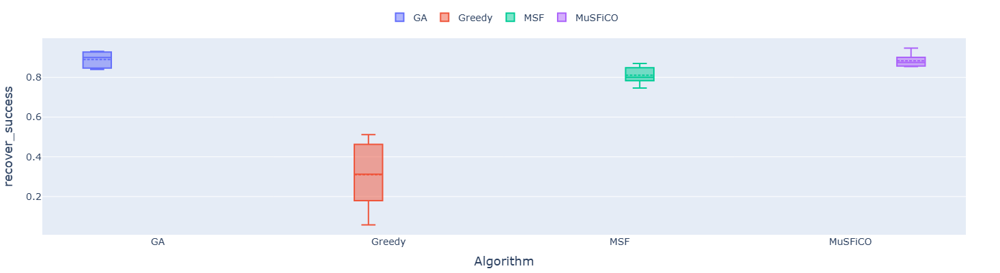

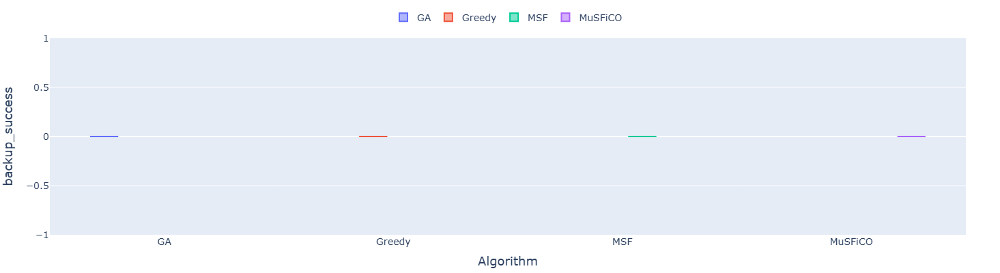

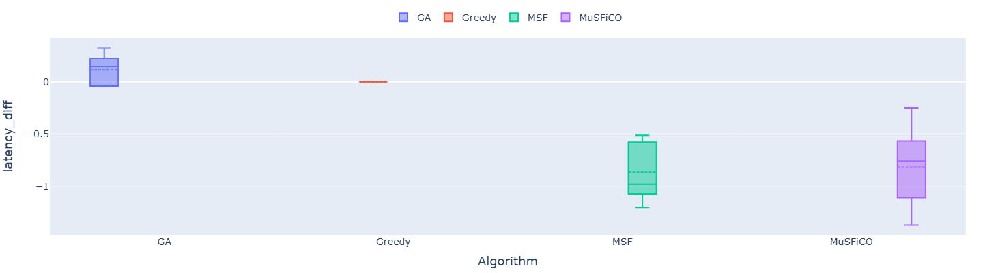

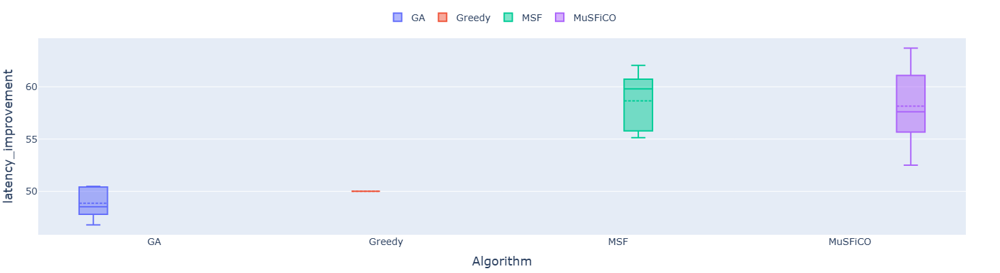

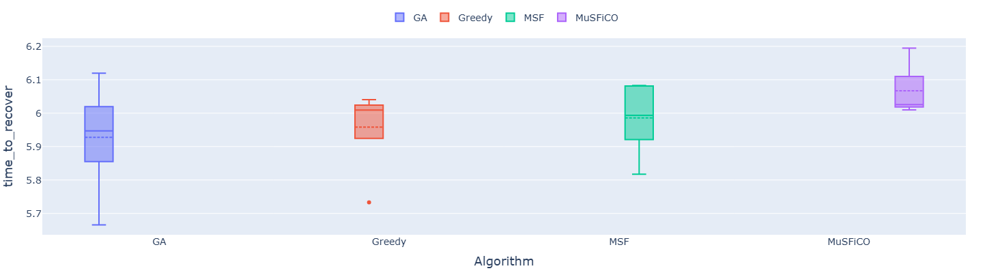

In [ ]:


df = aggregated_simulation_data


# Lista de métricas
metrics = [
    "recover_success",
    "backup_success",
    "latency_diff",
    "latency_improvement",
    "time_to_recover",
]


# Criação de um gráfico para cada métrica
for metric in metrics:
    fig = go.Figure()
    for algo in df["algorithm"].unique():
        algo_data = df[df["algorithm"] == algo]
        fig.add_trace(
            go.Box(
                y=algo_data[metric], name=algo, boxmean=True, marker=dict(size=6), showlegend=True
            )
        )

    fig.update_layout(
        yaxis_title=metric,
        xaxis_title="Algorithm",
        boxmode="group",
        legend=dict(
            orientation="h",  # Legenda na horizontal
            yanchor="bottom",
            y=1.05,  # Coloca a legenda logo acima do gráfico
            xanchor="center",
            x=0.5,
            font=dict(size=14),  # Aumenta o tamanho da fonte da legenda
        ),
        autosize=True,  # Permite o ajuste automático do tamanho
        margin=dict(l=50, r=50, t=10, b=50),  # Ajustes nas margens para mais flexibilidade
        height=400,  # Ajuste flexível no tamanho do plot
        width=600,  # Ajuste flexível no tamanho do plot
        font=dict(
            size=16  # Aumenta o tamanho geral da fonte
        ),
    )

    # Ajusta o tamanho da fonte dos eixos
    fig.update_xaxes(title_font=dict(size=18), tickfont=dict(size=14))
    fig.update_yaxes(title_font=dict(size=18), tickfont=dict(size=14))
    # Nome do arquivo baseado na métrica
    file_name = f"{metric}.pdf"
    fig.write_image(file_name, format="pdf")
    fig.show()